In [141]:
# import mplayer
import pydub
from pydub import AudioSegment
# from pathlib import Path
from pydub.playback import play
from IPython import display
import codecs
# import chardet
import numpy as np
import matplotlib.pyplot as plt
import librosa
from scipy import io
from pprint import pprint
import mutagen
import pandas as pd
%matplotlib inline

In [102]:
plt.rcParams['figure.figsize'] = (20, 6)

In [39]:
song_path = r'D:\MasterFiles\MachineLearning\anayzing-jay-chou-songs\Jay Chou\哎呦，不错哦\1806.一口气全念对.mp3'

In [161]:
song_path = Path(r'D:\MasterFiles\MachineLearning\anayzing-jay-chou-songs\Jay Chou\哎呦，不错哦\1806.一口气全念对.mp3')

In [164]:
song_path.

'file:///D:/MasterFiles/MachineLearning/anayzing-jay-chou-songs/Jay%20Chou/%E5%93%8E%E5%91%A6%EF%BC%8C%E4%B8%8D%E9%94%99%E5%93%A6/1806.%E4%B8%80%E5%8F%A3%E6%B0%94%E5%85%A8%E5%BF%B5%E5%AF%B9.mp3'

In [40]:
song_path

'D:\\MasterFiles\\MachineLearning\\anayzing-jay-chou-songs\\Jay Chou\\哎呦，不错哦\\1806.一口气全念对.mp3'

In [41]:
song = AudioSegment.from_mp3(song_path)

In [76]:
song

In [24]:
play(song)

In [22]:
display.Audio(r'D:\MasterFiles\MachineLearning\anayzing-jay-chou-songs\Jay Chou\哎呦，不错哦\1806.一口气全念对.mp3')

In [33]:
raw_data = song._data

In [34]:
len(raw_data)

28028784

In [35]:
raw_data[:20]

b'\x00\x00\xfd\xff\x00\x00\x01\x00\xff\xff\x01\x00\x01\x00\xff\xff\x00\x00\x01\x00'

In [45]:
mediainfo = pydub.utils.mediainfo(song_path)

In [111]:
pprint(mediainfo)

{'DISPOSITION': {'attached_pic': '0',
                 'clean_effects': '0',
                 'comment': '0',
                 'default': '0',
                 'dub': '0',
                 'forced': '0',
                 'hearing_impaired': '0',
                 'karaoke': '0',
                 'lyrics': '0',
                 'original': '0',
                 'timed_thumbnails': '0',
                 'visual_impaired': '0'},
 'TAG': {'album': '°¥ßÏ£¬²»´íÅ¶',
         'artist': 'ÖÜ½ÜÂ×',
         'comment': 'µ¥´¥½ÇÂìÒÏ¸ßÆ·ÖÊÒôÀÖ_www.1mayi.com',
         'encoder': 'LAME3.99r',
         'title': 'Ò»¿ÚÆøÈ«Äî¶Ô',
         'track': '06'},
 'avg_frame_rate': '0/0',
 'bit_rate': '320167',
 'bits_per_raw_sample': 'N/A',
 'bits_per_sample': '0',
 'channel_layout': 'stereo',
 'channels': '2',
 'codec_long_name': 'MP3 (MPEG audio layer 3)',
 'codec_name': 'mp3',
 'codec_tag': '0x0000',
 'codec_tag_string': '[0][0][0][0]',
 'codec_time_base': '1/44100',
 'codec_type': 'audio',
 'duration': '158.92

In [71]:
mediainfo['TAG']['album'].encode('latin1').decode('gbk')

'哎呦，不错哦'

In [72]:
mediainfo['TAG']['artist'].encode('latin1').decode('gbk')

'周杰伦'

In [73]:
mediainfo['TAG']['comment'].encode('latin1').decode('gbk')

'单触角蚂蚁高品质音乐_www.1mayi.com'

In [74]:
mediainfo['TAG']['title'].encode('latin1').decode('gbk')

'一口气全念对'

In [78]:
song_arr = song.get_array_of_samples()

In [79]:
type(song_arr)

array.array

In [80]:
song_arr[:10]

array('h', [0, -3, 0, 1, -1, 1, 1, -1, 0, 1])

In [82]:
song_arr = np.array(song_arr)

In [83]:
song_arr

array([ 0, -3,  0, ..., -1, -1,  1], dtype=int16)

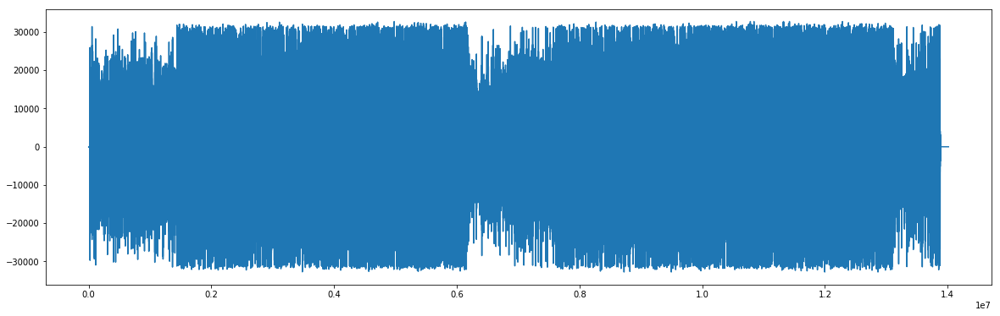

In [87]:
plt.plot(song_arr)

In [98]:
song_lib, sample_rate = librosa.load(song_path, sr=44100)

In [99]:
song_lib.shape

(7007196,)

In [100]:
sample_rate

44100

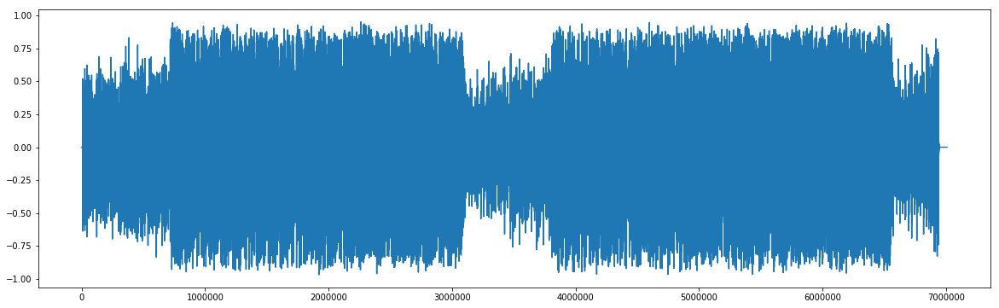

In [103]:
plt.plot(song_lib)

In [104]:
wav = song.export('一口气全念对.wav', format='wav')

In [107]:
rate, audiodata = io.wavfile.read('一口气全念对.wav')

In [112]:
rate

44100

In [113]:
audiodata.shape

(7007196, 2)

In [117]:
mutagen.File(song_path)

{'TPE1': TPE1(encoding=<Encoding.LATIN1: 0>, text=['ÖÜ½ÜÂ×']), 'TRCK': TRCK(encoding=<Encoding.LATIN1: 0>, text=['06']), 'TALB': TALB(encoding=<Encoding.LATIN1: 0>, text=['°¥ßÏ£¬²»´íÅ¶']), 'TIT2': TIT2(encoding=<Encoding.LATIN1: 0>, text=['Ò»¿ÚÆøÈ«Äî¶Ô']), 'COMM::chi': COMM(encoding=<Encoding.LATIN1: 0>, lang='chi', desc='', text=['µ¥´¥½ÇÂìÒÏ¸ßÆ·ÖÊÒôÀÖ_www.1mayi.com'])}

In [118]:
_.info.pprint()

'MPEG 1 layer 3, 320000 bps (CBR, LAME 3.99.1+, -b 320), 44100 Hz, 2 chn, 158.89 seconds'

In [120]:
audio = mutagen.mp3.MP3(song_path)

In [121]:
audio.filename

'D:\\MasterFiles\\MachineLearning\\anayzing-jay-chou-songs\\Jay Chou\\哎呦，不错哦\\1806.一口气全念对.mp3'

In [127]:
audio.keys()

dict_keys(['TPE1', 'TRCK', 'TALB', 'TIT2', 'COMM::chi'])

In [128]:
audio.items()

[('TPE1', TPE1(encoding=<Encoding.LATIN1: 0>, text=['ÖÜ½ÜÂ×'])),
 ('TRCK', TRCK(encoding=<Encoding.LATIN1: 0>, text=['06'])),
 ('TALB', TALB(encoding=<Encoding.LATIN1: 0>, text=['°¥ßÏ£¬²»´íÅ¶'])),
 ('TIT2', TIT2(encoding=<Encoding.LATIN1: 0>, text=['Ò»¿ÚÆøÈ«Äî¶Ô'])),
 ('COMM::chi',
  COMM(encoding=<Encoding.LATIN1: 0>, lang='chi', desc='', text=['µ¥´¥½ÇÂìÒÏ¸ßÆ·ÖÊÒôÀÖ_www.1mayi.com']))]

In [140]:
audio.info.version

1

In [146]:
pd.DataFrame.from_items(mediainfo.items())

,index,codec_name,codec_long_name,profile,codec_type,codec_time_base,codec_tag_string,codec_tag,sample_fmt,sample_rate,...,DISPOSITION,TAG,side_data_type,filename,nb_streams,nb_programs,format_name,format_long_name,size,probe_score
album,0,mp3,MP3 (MPEG audio layer 3),unknown,audio,1/44100,[0][0][0][0],0x0000,s16p,44100,...,NaN,°¥ßÏ£¬²»´íÅ¶,Replay Gain,D:\MasterFiles\MachineLearning\anayzing-jay-ch...,1,0,mp3,MP2/3 (MPEG audio layer 2/3),6360478,51
artist,0,mp3,MP3 (MPEG audio layer 3),unknown,audio,1/44100,[0][0][0][0],0x0000,s16p,44100,...,NaN,ÖÜ½ÜÂ×,Replay Gain,D:\MasterFiles\MachineLearning\anayzing-jay-ch...,1,0,mp3,MP2/3 (MPEG audio layer 2/3),6360478,51
attached_pic,0,mp3,MP3 (MPEG audio layer 3),unknown,audio,1/44100,[0][0][0][0],0x0000,s16p,44100,...,0,NaN,Replay Gain,D:\MasterFiles\MachineLearning\anayzing-jay-ch...,1,0,mp3,MP2/3 (MPEG audio layer 2/3),6360478,51
clean_effects,0,mp3,MP3 (MPEG audio layer 3),unknown,audio,1/44100,[0][0][0][0],0x0000,s16p,44100,...,0,NaN,Replay Gain,D:\MasterFiles\MachineLearning\anayzing-jay-ch...,1,0,mp3,MP2/3 (MPEG audio layer 2/3),6360478,51
comment,0,mp3,MP3 (MPEG audio layer 3),unknown,audio,1/44100,[0][0][0][0],0x0000,s16p,44100,...,0,µ¥´¥½ÇÂìÒÏ¸ßÆ·ÖÊÒôÀÖ_www.1mayi.com,Replay Gain,D:\MasterFiles\MachineLearning\anayzing-jay-ch...,1,0,mp3,MP2/3 (MPEG audio layer 2/3),6360478,51
default,0,mp3,MP3 (MPEG audio layer 3),unknown,audio,1/44100,[0][0][0][0],0x0000,s16p,44100,...,0,NaN,Replay Gain,D:\MasterFiles\MachineLearning\anayzing-jay-ch...,1,0,mp3,MP2/3 (MPEG audio layer 2/3),6360478,51
dub,0,mp3,MP3 (MPEG audio layer 3),unknown,audio,1/44100,[0][0][0][0],0x0000,s16p,44100,...,0,NaN,Replay Gain,D:\MasterFiles\MachineLearning\anayzing-jay-ch...,1,0,mp3,MP2/3 (MPEG audio layer 2/3),6360478,51
encoder,0,mp3,MP3 (MPEG audio layer 3),unknown,audio,1/44100,[0][0][0][0],0x0000,s16p,44100,...,NaN,LAME3.99r,Replay Gain,D:\MasterFiles\MachineLearning\anayzing-jay-ch...,1,0,mp3,MP2/3 (MPEG audio layer 2/3),6360478,51
forced,0,mp3,MP3 (MPEG audio layer 3),unknown,audio,1/44100,[0][0][0][0],0x0000,s16p,44100,...,0,NaN,Replay Gain,D:\MasterFiles\MachineLearning\anayzing-jay-ch...,1,0,mp3,MP2/3 (MPEG audio layer 2/3),6360478,51
hearing_impaired,0,mp3,MP3 (MPEG audio layer 3),unknown,audio,1/44100,[0][0][0][0],0x0000,s16p,44100,...,0,NaN,Replay Gain,D:\MasterFiles\MachineLearning\anayzing-jay-ch...,1,0,mp3,MP2/3 (MPEG audio layer 2/3),6360478,51


In [147]:
mediainfo.keys()

dict_keys(['index', 'codec_name', 'codec_long_name', 'profile', 'codec_type', 'codec_time_base', 'codec_tag_string', 'codec_tag', 'sample_fmt', 'sample_rate', 'channels', 'channel_layout', 'bits_per_sample', 'id', 'r_frame_rate', 'avg_frame_rate', 'time_base', 'start_pts', 'start_time', 'duration_ts', 'duration', 'bit_rate', 'max_bit_rate', 'bits_per_raw_sample', 'nb_frames', 'nb_read_frames', 'nb_read_packets', 'DISPOSITION', 'TAG', 'side_data_type', 'filename', 'nb_streams', 'nb_programs', 'format_name', 'format_long_name', 'size', 'probe_score'])

In [153]:
mediainfo

{'index': '0',
 'codec_name': 'mp3',
 'codec_long_name': 'MP3 (MPEG audio layer 3)',
 'profile': 'unknown',
 'codec_type': 'audio',
 'codec_time_base': '1/44100',
 'codec_tag_string': '[0][0][0][0]',
 'codec_tag': '0x0000',
 'sample_fmt': 's16p',
 'sample_rate': '44100',
 'channels': '2',
 'channel_layout': 'stereo',
 'bits_per_sample': '0',
 'id': 'N/A',
 'r_frame_rate': '0/0',
 'avg_frame_rate': '0/0',
 'time_base': '1/14112000',
 'start_pts': '353600',
 'start_time': '0.025057',
 'duration_ts': '2242805760',
 'duration': '158.928980',
 'bit_rate': '320167',
 'max_bit_rate': 'N/A',
 'bits_per_raw_sample': 'N/A',
 'nb_frames': 'N/A',
 'nb_read_frames': 'N/A',
 'nb_read_packets': 'N/A',
 'DISPOSITION': {'default': '0',
  'dub': '0',
  'original': '0',
  'comment': '0',
  'lyrics': '0',
  'karaoke': '0',
  'forced': '0',
  'hearing_impaired': '0',
  'visual_impaired': '0',
  'clean_effects': '0',
  'attached_pic': '0',
  'timed_thumbnails': '0'},
 'TAG': {'encoder': 'LAME3.99r',
  'arti

In [151]:
def flatten(d, parent_key='', sep='_'):
    items = []
    for k, v in d.items():
        new_key = parent_key + sep + k if parent_key else k
        if isinstance(v, dict):
            items.extend(flatten(v, new_key, sep=sep).items())
        else:
            items.append((new_key, v))
    return dict(items)

In [152]:
flatten(mediainfo)

{'index': '0',
 'codec_name': 'mp3',
 'codec_long_name': 'MP3 (MPEG audio layer 3)',
 'profile': 'unknown',
 'codec_type': 'audio',
 'codec_time_base': '1/44100',
 'codec_tag_string': '[0][0][0][0]',
 'codec_tag': '0x0000',
 'sample_fmt': 's16p',
 'sample_rate': '44100',
 'channels': '2',
 'channel_layout': 'stereo',
 'bits_per_sample': '0',
 'id': 'N/A',
 'r_frame_rate': '0/0',
 'avg_frame_rate': '0/0',
 'time_base': '1/14112000',
 'start_pts': '353600',
 'start_time': '0.025057',
 'duration_ts': '2242805760',
 'duration': '158.928980',
 'bit_rate': '320167',
 'max_bit_rate': 'N/A',
 'bits_per_raw_sample': 'N/A',
 'nb_frames': 'N/A',
 'nb_read_frames': 'N/A',
 'nb_read_packets': 'N/A',
 'DISPOSITION_default': '0',
 'DISPOSITION_dub': '0',
 'DISPOSITION_original': '0',
 'DISPOSITION_comment': '0',
 'DISPOSITION_lyrics': '0',
 'DISPOSITION_karaoke': '0',
 'DISPOSITION_forced': '0',
 'DISPOSITION_hearing_impaired': '0',
 'DISPOSITION_visual_impaired': '0',
 'DISPOSITION_clean_effects': '

In [160]:
pd.Series(data=flatten(mediainfo))

DISPOSITION_attached_pic                                                        0
DISPOSITION_clean_effects                                                       0
DISPOSITION_comment                                                             0
DISPOSITION_default                                                             0
DISPOSITION_dub                                                                 0
DISPOSITION_forced                                                              0
DISPOSITION_hearing_impaired                                                    0
DISPOSITION_karaoke                                                             0
DISPOSITION_lyrics                                                              0
DISPOSITION_original                                                            0
DISPOSITION_timed_thumbnails                                                    0
DISPOSITION_visual_impaired                                                     0
TAG_album       

In [165]:
df = pd.DataFrame()

In [175]:
df.append(pd.Series(data=flatten(mediainfo)), ignore_index=True)

,DISPOSITION_attached_pic,DISPOSITION_clean_effects,DISPOSITION_comment,DISPOSITION_default,DISPOSITION_dub,DISPOSITION_forced,DISPOSITION_hearing_impaired,DISPOSITION_karaoke,DISPOSITION_lyrics,DISPOSITION_original,...,probe_score,profile,r_frame_rate,sample_fmt,sample_rate,side_data_type,size,start_pts,start_time,time_base
0,0,0,0,0,0,0,0,0,0,0,...,51,unknown,0/0,s16p,44100,Replay Gain,6360478,353600,0.025057,1/14112000
